# Customers Churn

The Telco company specializes in providing telephone and internet service to California. Thanks to its promotions, the company reached the number of 7,073 customers during the third quarter. However, it encounters serious difficulties in retaining its customers. In fact, the disengagement rate during this quarter was around 26.54%. This difficulty in retaining customers is reflected in the structure of the company's customer base:
    •	25% of customers have less than 9 months of relationship
    •	The median duration of the customer relationship with the company is 29 months, far from the 72 months relationship of the most loyal customers
    •	75% of customers have a relationship duration of less than 55 months.
Telco Management would like to commit to a loyalty policy by reducing the disengagement rate to less than 10% by:
    •	Identification, upon entering a relationship, of the customers most likely to leave the company after the promotion period.
    •	Concrete actions are likely to build loyalty among current customers.
The Data Science team was entrusted with the mission of identifying the factors on which to act to retain existing customers and to develop a model to identify potential customers towards whom future promotions should be directed.
This work involves the participation of:
    •	General management for orientations
    •	Director of the Customer Service team
    •	Director of the Marketing team
    •	Director of Technology
It was produced using information available in the customer database which contains 33 variables for each customer.
The approach adopted is:
    •	To retain the 'Churn Label' column as an explanatory or independent variable
    •	To determine to what extent each of the other variables allows predicting the explanatory variable
    •	To retain the most relevant variables to develop a model based on the regression mode with the smallest absolute error
The Data Science team will submit the following documents at the end of this study:
    •	The Model Code
    •	A two-page report:
        o	Relating the conclusions of the different stages of data processing
        o	Presenting the model
        o	Recommendations
        o	Possible considerations to consider when applying the conclusions
    •	A slide deck


In [1]:
import sys


In [2]:
import os

def find_file(filename, search_path):
    for root, dirs, files in os.walk(search_path):
        if filename in files:
            print(os.path.join(root, filename))

# Replace with the directory you want to search (e.g., home directory)
find_file('sb_utils.py', 'C:/Users/wgerm/OneDrive/Documents/GitHub')

C:/Users/wgerm/OneDrive/Documents/GitHub\DataScienceGuidedCapstone\Notebooks\library\sb_utils.py


In [3]:
sys.path.append('C:/Users/wgerm/OneDrive/Documents/GitHub/DataScienceGuidedCapstone/Notebooks')

In [4]:
#Code task 1#
#Import pandas, matplotlib.pyplot and seaborn 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

from library.sb_utils import save_file

In [5]:
from sklearn.decomposition import PCA

from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score, KFold

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics import recall_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler


In [6]:
#Code Task 3#
# Use the function set_option to visualize all columns of DataFrames
pd.set_option('display.max_columns', None)

## 1.0 Load The Telco_customer_churn Data

In [7]:
#Code task 2#
cust_churn = pd.read_excel("Telco_customer_churn.xlsx")

### 1.1 Auditing the data and display the first few records

In [8]:
#Code task 3#
# Visualize the head of the dataset
cust_churn.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1.0,United States,California,Los Angeles,90003.0,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1.0,86.0,3239.0,Competitor made better offer
1,9237-HQITU,1.0,United States,California,Los Angeles,90005.0,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1.0,67.0,2701.0,Moved
2,9305-CDSKC,1.0,United States,California,Los Angeles,90006.0,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8.0,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1.0,86.0,5372.0,Moved
3,7892-POOKP,1.0,United States,California,Los Angeles,90010.0,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28.0,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1.0,84.0,5003.0,Moved
4,0280-XJGEX,1.0,United States,California,Los Angeles,90015.0,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49.0,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1.0,89.0,5340.0,Competitor had better devices


In [9]:
# Code task 3#
cust_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7046 entries, 0 to 7045
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   float64
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   float64
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   float64
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

The higher number of non-null rows of information in the 'Churn Value' column suggests the presence of null values in the dataset

In [10]:
# Drop of row with no Chun Label

In [11]:
cust_churn[['Churn Value']].isna().sum(axis=1)

0       0
1       0
2       0
3       0
4       0
       ..
7041    0
7042    0
7043    1
7044    0
7045    0
Length: 7046, dtype: int64

## 2.0 Exploring The Data

### 2.1 Number of Missing Values By column

In [12]:
#Code task 5#
#Count missing values in number and percetage and present the result in a single table
missing_values = pd.concat([cust_churn.isnull().sum(), 100*cust_churn.isnull().mean()],axis=1)
missing_values.columns =['count','%']
missing_values.sort_values(by="%", ascending=False)

,count,%
Churn Reason,5177,73.474312
Count,3,0.042577
CLTV,3,0.042577
Churn Score,3,0.042577
Churn Label,3,0.042577
Total Charges,3,0.042577
Monthly Charges,3,0.042577
Payment Method,3,0.042577
Paperless Billing,3,0.042577
Contract,3,0.042577


As mentioned above, the columns are well referenced. The missing information in the Churn reason column can be explained and can be addressed later

### 2.2 Categorical Features

In [13]:
#Code task 6#
#Select columns of dtype 'object'
cust_churn.select_dtypes('object').T

0                      1     \
CustomerID                           3668-QPYBK             9237-HQITU   
Country                           United States          United States   
State                                California             California   
City                                Los Angeles            Los Angeles   
Lat Long                 33.964131, -118.272783  34.059281, -118.30742   
Gender                                     Male                 Female   
Senior Citizen                               No                     No   
Partner                                      No                     No   
Dependents                                   No                    Yes   
Phone Service                               Yes                    Yes   
Multiple Lines                               No                     No   
Internet Service                            DSL            Fiber optic   
Online Security                             Yes                     No   
Online Backup                               Yes                     No   
Device Protection                            No                     No   
Tech Support                                 No                     No   
Streaming TV                                 No                     No   
Streaming Movies                             No                     No   
Contract                         Month-to-month         Month-to-month   
Paperless Billing                           Yes                    Yes   
Payment Method                     Mailed check       Electronic check   
Total Charges                            108.15                 151.65   
Churn Label                                 Yes                    Yes   
Churn Reason       Competitor made better offer                  Moved   

                                     2                       3     \
CustomerID                     9305-CDSKC              7892-POOKP   
Country                     United States           United States   
State                          California              California   
City                          Los Angeles             Los Angeles   
Lat Long           34.048013, -118.293953  34.062125, -118.315709   
Gender                             Female                  Female   
Senior Citizen                         No                      No   
Partner                                No                     Yes   
Dependents                            Yes                     Yes   
Phone Service                         Yes                     Yes   
Multiple Lines                        Yes                     Yes   
Internet Service              Fiber optic             Fiber optic   
Online Security                        No                      No   
Online Backup                          No                      No   
Device Protection                     Yes                     Yes   
Tech Support                           No                     Yes   
Streaming TV                          Yes                     Yes   
Streaming Movies                      Yes                     Yes   
Contract                   Month-to-month          Month-to-month   
Paperless Billing                     Yes                     Yes   
Payment Method           Electronic check        Electronic check   
Total Charges                       820.5                 3046.05   
Churn Label                           Yes                     Yes   
Churn Reason                        Moved                   Moved   

                                            4     \
CustomerID                            0280-XJGEX   
Country                            United States   
State                                 California   
City                                 Los Angeles   
Lat Long                  34.039224, -118.266293   
Gender                                      Male   
Senior Citizen                                No   
Partner                                       No  

#### 2.2.1 Unique Customers

In [14]:
#Code task 7#
cust_churn['CustomerID'].value_counts().head()

CustomerID
3668-QPYBK    1
9169-BSVIN    1
0206-OYVOC    1
6418-HNFED    1
8805-JNRAZ    1
Name: count, dtype: int64

There is no duplication of customers as the value_counts rank the data from the greater to the lower. So, each row is unique.

#### 2.2.2 Country, State And City

In [15]:
#Code task 8#
cust_churn_location = cust_churn[['Country','State','City']].value_counts().sort_values(ascending=False)
cust_churn_location

Country        State       City               
United States  California  Los Angeles            305
                           San Diego              150
                           San Jose               112
                           Sacramento             108
                           San Francisco          104
                                                 ... 
                           Running Springs          4
                           San Quentin              4
                           San Juan Capistrano      4
                           Volcano                  4
                           Zenia                    4
Name: count, Length: 1129, dtype: int64

The data relate all to the State of California in United States. The columns "Country" and "State" contain the same information for all rows, so are not relevant

In [16]:
# Drop the columns 'Country' and 'State'
cust_churn.drop(['Country', 'State'], inplace=True, axis=1)
print(cust_churn.columns)

Index(['CustomerID', 'Count', 'City', 'Zip Code', 'Lat Long', 'Latitude',
       'Longitude', 'Gender', 'Senior Citizen', 'Partner', 'Dependents',
       'Tenure Months', 'Phone Service', 'Multiple Lines', 'Internet Service',
       'Online Security', 'Online Backup', 'Device Protection', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charges', 'Total Charges', 'Churn Label',
       'Churn Value', 'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')


#### 2.2.3 Unique City

In [17]:
## Code task 9#
# Call the numique method on the column 'City" to check the unique number of cities
state_churn_num_city =cust_churn['City'].nunique()
state_churn_num_city


1129

##### California is made up of 482 cities. Some places register as 'City' in the Database may not be.

In [18]:
## code task 10#
## Downloading the list of the cities within California to identify the places wrongly register as City
california_city = pd.read_excel("C:/Users/wgerm/OneDrive/Documents/GitHub/wgermain24/archive CHURN/California_city.xlsx")

In [19]:
#Code task 11#
#Call the info() method on California_city to have a big picture of the columns
california_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480 entries, 0 to 479
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Entity Name                 480 non-null    object
 1   Entity ID                   480 non-null    int64 
 2   Entity Type                 480 non-null    object
 3   County Name                 480 non-null    object
 4   City                        480 non-null    object
 5   State                       480 non-null    object
 6   Zip                         480 non-null    object
 7   Estimated Population        480 non-null    int64 
 8   Class Data                  480 non-null    object
 9   Fiscal Year End             480 non-null    int64 
 10  Paper Report Due Date       480 non-null    int64 
 11  Electronic Report Due Date  480 non-null    int64 
dtypes: int64(5), object(7)
memory usage: 45.1+ KB


In [20]:
#Code task 12#
#Check on the names of the columns
california_city.columns

Index(['Entity Name', 'Entity ID', 'Entity Type', 'County Name', 'City',
       'State', 'Zip', 'Estimated Population', 'Class Data', 'Fiscal Year End',
       'Paper Report Due Date', 'Electronic Report Due Date'],
      dtype='object')

In [21]:
#Code task 13# 
#Call the head method on California_city to print several rows of the data
california_city.head()

,Entity Name,Entity ID,Entity Type,County Name,City,State,Zip,Estimated Population,Class Data,Fiscal Year End,Paper Report Due Date,Electronic Report Due Date
0,Adelanto,1128,CIT,San Bernardino,Adelanto,CA,92301,36357,Chartered,630,131,131
1,Agoura Hills,1129,CIT,Los Angeles,Agoura Hills,CA,91301,19771,General Law,630,131,131
2,Alameda,1130,CIT,Alameda,Alameda,CA,94501,77784,Chartered,630,131,131
3,Albany,1131,CIT,Alameda,Albany,CA,94706-2226,21648,Chartered,630,131,131
4,Alhambra,1132,CIT,Los Angeles,Alhambra,CA,91802-2351,81834,Chartered,630,131,131


In [22]:
#Code task 14#
#Select some relevant columns of california_city and define a new DataFrame with those columns
#print several rows of the new DataFrame by using the head method
california_cities = california_city.loc[ :, ['Entity ID', 'County Name','City','Zip','Estimated Population']].copy()
california_cities.columns = ['Entity ID', 'County Name','City','Zip','Estimated Population']
california_cities.head()

,Entity ID,County Name,City,Zip,Estimated Population
0,1128,San Bernardino,Adelanto,92301,36357
1,1129,Los Angeles,Agoura Hills,91301,19771
2,1130,Alameda,Alameda,94501,77784
3,1131,Alameda,Albany,94706-2226,21648
4,1132,Los Angeles,Alhambra,91802-2351,81834


In [23]:
#Code task 15#
#Find the cities in `cust_churn` that are not in `california_cities`
#Using: set(list1) - set(list2) is an easy way to get items in list1 that are not in list2
missing_cities = set(cust_churn.City) - set(california_cities.City)
missing_cities

{'Acampo',
 'Acton',
 'Adin',
 'Aguanga',
 'Ahwahnee',
 'Alamo',
 'Albion',
 'Alderpoint',
 'Alleghany',
 'Alpaugh',
 'Alpine',
 'Alta',
 'Altadena',
 'Alviso',
 'Amador City',
 'Amboy',
 'Angelus Oaks',
 'Angwin',
 'Annapolis',
 'Antelope',
 'Anza',
 'Applegate',
 'Aptos',
 'Arbuckle',
 'Armona',
 'Arnold',
 'Aromas',
 'Auberry',
 'Avery',
 'Avila Beach',
 'Badger',
 'Baker',
 'Ballico',
 'Bangor',
 'Bass Lake',
 'Bayside',
 'Beale Afb',
 'Bella Vista',
 'Belvedere Tiburon',
 'Ben Lomond',
 'Benton',
 'Berry Creek',
 'Bethel Island',
 'Bieber',
 'Big Bar',
 'Big Bear City',
 'Big Bend',
 'Big Creek',
 'Big Oak Flat',
 'Big Pine',
 'Big Sur',
 'Biola',
 'Birds Landing',
 'Blairsden Graeagle',
 'Blocksburg',
 'Bloomington',
 'Bodega',
 'Bodega Bay',
 'Bodfish',
 'Bolinas',
 'Bonita',
 'Bonsall',
 'Boonville',
 'Boron',
 'Borrego Springs',
 'Boulder Creek',
 'Boulevard',
 'Bradley',
 'Branscomb',
 'Bridgeport',
 'Bridgeville',
 'Brookdale',
 'Brooks',
 'Browns Valley',
 'Brownsville',
 '

In [24]:
#Code task 16#
#Check on the number of cities that are in cust_churn but not in california_cities
len(missing_cities)

689

#### Checking for some missing values ​​reveals that these are territorial divisions used by the census bureau:
- Census-designated place : CDP
- Census County Division : C
- Unincorporated community : UNINCD
Additionally, historical naming conventions differentiate between cities and to

It is indicated to:
- rename the City column by Name_place
- insert a new column that specifies the differences between the different placeswns

In [25]:
#Code task 17#
#Downloading the list of Census-designated place (CDP), Census County Division(CCD), Cities and towns in California
#This list contains more places than the precedent list but less features
california_divi_terr = pd.read_csv("C:/Users/wgerm/OneDrive/Documents/GitHub/wgermain24/archive CHURN/California_county_cities.csv")

In [26]:
#Code task 18#
#Call the head method on new DataFrame to print several rows
california_divi_terr.head()

,Name,Name_concat_type,Entity Type,County
0,Berkeley,Berkeley CCD,CCD,Alameda County
1,Fremont-Newark,Fremont-Newark CCD,CCD,Alameda County
2,Hayward,Hayward CCD,CCD,Alameda County
3,Livermore-Pleasanton,Livermore-Pleasanton CCD,CCD,Alameda County
4,Oakland,Oakland CCD,CCD,Alameda County


In [27]:
#Code task 19#
#Check the labels of the columns using the columns method
california_divi_terr.columns

Index(['Name', 'Name_concat_type', 'Entity Type', 'County'], dtype='object')

In [28]:
#Code task 20#
#Same code as code 15 but now with the new more complete California location DataFrame
#Find the cities in `cust_churn` that are not in `california_cities`
#Using: set(list1) - set(list2) is an easy way to get items in list1 that are not in list2
missing_cities2 = set(cust_churn.City) - set(california_divi_terr.Name)
missing_cities2

{'Woodland Hills', 'Yosemite National Park'}

In [29]:
#Code task 21#
#Check the number of cities in cust_churn that are note in the official territorial division
len(missing_cities2)

2

Only two cities in cust_churn were not identified as being part of California's territorial divisions. In fact, these are public places that will be manually recorded as "pla" (stand for place)

In [30]:
#Code task 22#
#Create a new DataFrame by merging the DataFrame Cust_churn and the DataFrame california_divi_terr
#call the head method to print several row after the merging

df_cust_churn = pd.merge(cust_churn,california_divi_terr, left_on = 'City', right_on ='Name')
df_cust_churn.head()

,CustomerID,Count,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason,Name,Name_concat_type,Entity Type,County
0,3668-QPYBK,1.0,Los Angeles,90003.0,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1.0,86.0,3239.0,Competitor made better offer,Los Angeles,Los Angeles CCD,CCD,Los Angeles County
1,3668-QPYBK,1.0,Los Angeles,90003.0,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1.0,86.0,3239.0,Competitor made better offer,Los Angeles,Los Angeles CDP,CDP,Los Angeles County
2,3668-QPYBK,1.0,Los Angeles,90003.0,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1.0,86.0,3239.0,Competitor made better offer,Los Angeles,Los Angeles,CIT,Los Angeles County
3,9237-HQITU,1.0,Los Angeles,90005.0,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1.0,67.0,2701.0,Moved,Los Angeles,Los Angeles CCD,CCD,Los Angeles County
4,9237-HQITU,1.0,Los Angeles,90005.0,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1.0,67.0,2701.0,Moved,Los Angeles,Los Angeles CDP,CDP,Los Angeles County


#### 2.2.4 Distribution of Churn by City

In [31]:
#Code task 23#
#Use of the pattern dataframe.groupby to determine the number of churn by City
Churn_city = df_cust_churn.groupby('City')['Churn Label'].sum()
Churn_city

City
Acampo                                   YesYesYesNo
Acton                                       NoNoNoNo
Adelanto                                 YesNoNoNoNo
Adin                                      YesYesNoNo
Agoura Hills                            YesYesNoNoNo
                                ...                 
Yreka                               NoNoNoNoNoNoNoNo
Yuba City       YesYesYesYesNoNoNoNoNoNoNoNoNoNoNoNo
Yucaipa                           YesYesNoNoNoNoNoNo
Yucca Valley                              NoNoNoNoNo
Zenia                                      YesNoNoNo
Name: Churn Label, Length: 1127, dtype: object

The concatenation of values ​​suggests that "Yes" and "No" are stored as string values, not boolean values ​​in the column named "Churn Label". They should be checked in all other columns where they appear and converted if necessary.

In [32]:
#Code task 24#
# Define the mapping and apply it to the selected columns
#Lisf of columns with the same pattern
#Call the info method to get a preview of the columns after performing the mapping
mapping = {'Yes': True, 'No': False}
column_to_convert = ['Senior Citizen', 'Partner', 'Dependents','Phone Service', 'Multiple Lines','Online Security','Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies','Paperless Billing', 'Churn Label']
df_cust_churn[column_to_convert] = df_cust_churn[column_to_convert].map(lambda x: mapping.get(x, False))

df_cust_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11782 entries, 0 to 11781
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         11779 non-null  object 
 1   Count              11779 non-null  float64
 2   City               11779 non-null  object 
 3   Zip Code           11779 non-null  float64
 4   Lat Long           11779 non-null  object 
 5   Latitude           11779 non-null  float64
 6   Longitude          11779 non-null  float64
 7   Gender             11779 non-null  object 
 8   Senior Citizen     11782 non-null  bool   
 9   Partner            11782 non-null  bool   
 10  Dependents         11782 non-null  bool   
 11  Tenure Months      11779 non-null  float64
 12  Phone Service      11782 non-null  bool   
 13  Multiple Lines     11782 non-null  bool   
 14  Internet Service   11779 non-null  object 
 15  Online Security    11782 non-null  bool   
 16  Online Backup      117

In [33]:
#Code task 25#
#Check the contents of one of the columns ('Churn Label') 
print(df_cust_churn['Churn Label'])

0         True
1         True
2         True
3         True
4         True
         ...  
11777    False
11778    False
11779    False
11780    False
11781    False
Name: Churn Label, Length: 11782, dtype: bool


In [34]:
#Code task 26#
#Similar with code task 23 after converting the colummns from dtype Object to the dtype bool
Churn_city  = df_cust_churn.groupby('City')['Churn Label'].sum()
Churn_city

City
Acampo          3
Acton           0
Adelanto        1
Adin            2
Agoura Hills    2
               ..
Yreka           0
Yuba City       4
Yucaipa         2
Yucca Valley    0
Zenia           1
Name: Churn Label, Length: 1127, dtype: int64

The test on the column 'Churn Label' confirm that the column had converted properly from dtype 'string' to dtype 'Boolean'

2.2.5 Numeric values register as Object 

Total Charges is a numeric value but appear as an object. This column have to correct

In [35]:
#Code task 27#
#Check the "Total Charges" column to get an idea of ​​what might explain the object data type attribute
print(df_cust_churn['Total Charges'])

0        108.15
1        108.15
2        108.15
3        151.65
4        151.65
          ...  
11777    346.45
11778    6844.5
11779       NaN
11780       NaN
11781       NaN
Name: Total Charges, Length: 11782, dtype: object


In [36]:
#Code task 28# 
# Replace empty strings with NaN as the column might be recognized as an object type because of Non-numeric characters mixed in with numbers, Missing values (NaN or None) or Spaces or other formatting issues.
df_cust_churn['Total Charges'] = df_cust_churn['Total Charges'].replace('', np.nan)

In [37]:
#Code task 29#
# Convert to numeric, forcing errors to NaN
df_cust_churn['Total Charges'] = pd.to_numeric(cust_churn['Total Charges'], errors='coerce')

In [38]:
#Code task 30#
#Check the new type
print(df_cust_churn['Total Charges'].dtype)

float64


The "Total Charges" column has been converted from dtype Object to numeric

In [39]:
#Code task 31#
#Check on the column 'Internet Service'
df_cust_churn['Internet Service'].value_counts().head()


Internet Service
Fiber optic    5139
DSL            4097
No             2543
Name: count, dtype: int64

In [40]:
#Code task 32#
#Check on the column 'Contract'
df_cust_churn['Contract'].value_counts().head()

Contract
Month-to-month    6530
Two year          2794
One year          2455
Name: count, dtype: int64

In [41]:
#Code task 33#
#Check on the column 'Payment Method'
df_cust_churn['Payment Method'].value_counts().head()

Payment Method
Electronic check             3977
Mailed check                 2716
Credit card (automatic)      2554
Bank transfer (automatic)    2532
Name: count, dtype: int64

In [42]:
#Code task 34#
#Check on the column 'Churn Reason'
df_cust_churn['Churn Reason'].value_counts().head()

Churn Reason
Competitor offered higher download speeds    339
Attitude of support person                   312
Competitor offered more data                 284
Don't know                                   263
Competitor made better offer                 236
Name: count, dtype: int64

### 2.3 Numeric Features


#### 2.3.1 Numeric data

In [43]:
#Code task 35#
#Call the describe method for a statistical summary of the numerical columns
df_cust_churn.describe().T

,count,mean,std,min,25%,50%,75%,max
Count,11779.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Zip Code,11779.0,93383.049410,1922.777070,90001.000000,92016.500000,93460.000000,95247.000000,96161.000000
Latitude,11779.0,36.137781,2.411061,32.555828,34.011755,35.916943,38.044523,41.962127
Longitude,11779.0,-119.749765,2.128376,-124.301372,-121.759537,-119.513163,-118.078097,-114.192901
Tenure Months,11779.0,32.213685,24.485594,0.000000,9.000000,29.000000,55.000000,72.000000
Monthly Charges,11779.0,64.680805,30.085892,18.250000,35.650000,70.200000,89.850000,118.750000
Total Charges,7032.0,2283.300441,2266.771362,18.800000,401.450000,1397.475000,3794.737500,8684.800000
Churn Value,11781.0,0.426727,17.213426,0.000000,0.000000,0.000000,1.000000,1868.000000
Churn Score,11779.0,58.881144,21.469308,5.000000,41.000000,61.000000,76.000000,100.000000
CLTV,11779.0,4396.888276,1182.280767,2003.000000,3460.000000,4521.000000,5375.000000,6500.000000


#### 2.3.2 Distribution Of Features Values

array([[<Axes: title={'center': 'Count'}>,
        <Axes: title={'center': 'Zip Code'}>,
        <Axes: title={'center': 'Latitude'}>],
       [<Axes: title={'center': 'Longitude'}>,
        <Axes: title={'center': 'Tenure Months'}>,
        <Axes: title={'center': 'Monthly Charges'}>],
       [<Axes: title={'center': 'Total Charges'}>,
        <Axes: title={'center': 'Churn Value'}>,
        <Axes: title={'center': 'Churn Score'}>],
       [<Axes: title={'center': 'CLTV'}>, <Axes: >, <Axes: >]],
      dtype=object)

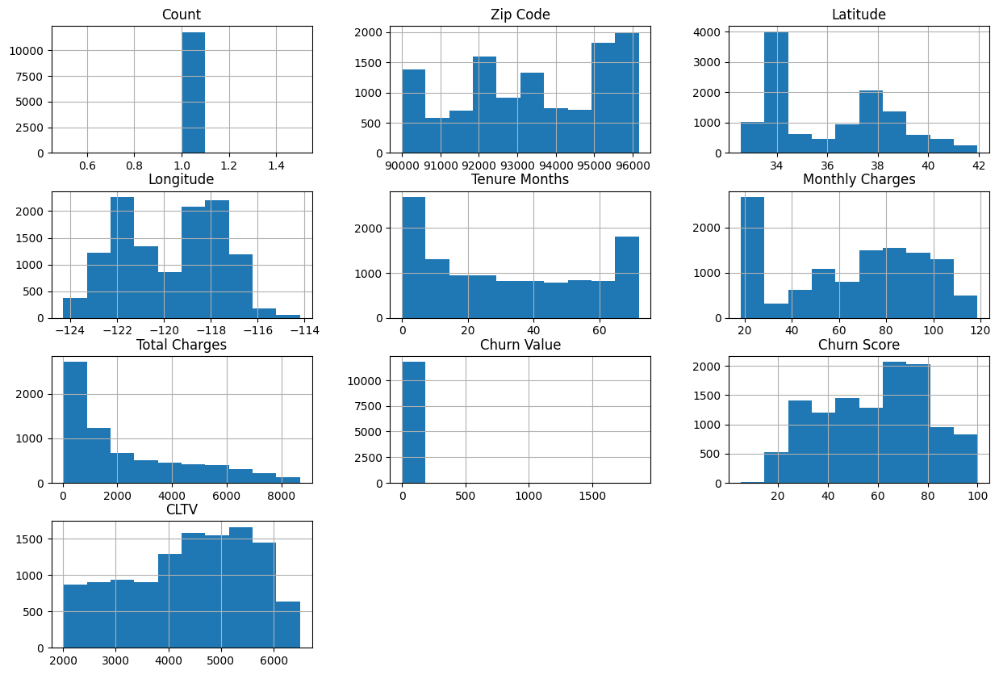

In [44]:
##Code task 36#
#Call cust_churn's 'hist' method to plot histagrams of each of the numeric features
df_cust_churn.hist(figsize = (15,10))

##### Features with possible cause for concern about :
- "Montly Charges" because of the concentration of values observed at the start of the normal curve. This can be explain by the fact most of people choose the lowest price plan
- "Tenure Months" because of the high number below 30. This is the problem that we have to solve.

Conclusion: Features do not present any problem at firt glance

#### 2.3.4 Some statistics related to "Tenure Months" and Churn Label, the indepedant variable

In [45]:
#Code task 37#
#Determine the average customer retention period;
#Determine the median customer retention period;
#Determine the maximum customer retention period;
#Calculate the quantile 75%
#Calculate the quantile 25%
#group the above results into one line
mean_tenure = pd.Series(df_cust_churn['Tenure Months'].mean(), name='Mean')
median_tenure = pd.Series(df_cust_churn['Tenure Months'].median(), name='Median')
max_tenure = pd.Series(df_cust_churn['Tenure Months'].max(), name='Max')
quantile_75 = pd.Series(df_cust_churn['Tenure Months'].quantile(0.75), name='Q(75)')
quantile_25 = pd.Series(df_cust_churn['Tenure Months'].quantile(0.25), name='Q25')
# Concatenate Series into a DataFrame
churn_stat = pd.concat([mean_tenure, median_tenure, max_tenure,quantile_75,quantile_25], axis=1)

print(churn_stat)

        Mean  Median   Max  Q(75)  Q25
0  32.213685    29.0  72.0   55.0  9.0


In [46]:
#Code task 38#
#Distribution of customers, according to 'Tenure Months'
#Determine first the number of custumers by 'Tenure
#Convert the Series in a DataFrame by the frame method
#Add a new column in the precedent DataFrame
df_cust_churn_tenure = df_cust_churn.groupby('Tenure Months')['Tenure Months'].count().sort_values(ascending=False)
df_cust_churn_tenure2 = df_cust_churn_tenure.to_frame()
df_cust_churn_tenure2['%']= 100* df_cust_churn_tenure/df_cust_churn['Tenure Months'].count()
df_cust_churn_tenure2.head(15)

,Tenure Months,%
Tenure Months,,
1.0,1035,8.786824
72.0,596,5.059852
2.0,374,3.175142
3.0,324,2.750658
71.0,290,2.462009
4.0,289,2.453519
5.0,234,1.986586
7.0,226,1.918669
8.0,213,1.808303


### 2.6 Missing Values

In [47]:
#Code task 39#
#Check the shape of the DataFrame before remove rows
df_cust_churn.shape

(11782, 35)

#### 2.6.1 Drop rows With missing values in the columns 'Churn Label' and 'CustomerID'

In [48]:
# Code task  40# 
# Number of rows with missing values in 'Churn Label'
cust_churn['Churn Label'].isnull().sum()

3

In [49]:
# Code task 41#
# Display the rows with missing values in the 'Churn Label' column
cust_churn_Churn_label_null = cust_churn[cust_churn['Churn Label'].isnull()]
cust_churn_Churn_label_null

,CustomerID,Count,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
7043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7044,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1868.000000,NaN,NaN,NaN
7045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.265492,NaN,NaN,NaN


In [50]:
#Code task 42#
#Count the number of missing values for the column 'CustomerID"
df_cust_churn['CustomerID'].isnull().sum()

3

In [51]:
#Code task 43#
#Remove rows with  missing values in the columns CustomerID and Churn label
df_cust_churn_cleaned = df_cust_churn.dropna(subset =['CustomerID','Churn Label'])

In [52]:
# Code task 44# 
# Identify the rows with missing values for the feature 'County'
county_null = df_cust_churn[df_cust_churn['County'].isnull()]
county_null

,CustomerID,Count,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason,Name,Name_concat_type,Entity Type,County
490,6166-ILMNY,1.0,Tomales,94971.0,"38.240769, -122.901041",38.240769,-122.901041,Female,False,False,False,2.0,True,False,Fiber optic,False,False,False,False,False,False,Month-to-month,False,Bank transfer (automatic),69.75,247.25,True,1.0,68.0,5667.0,Competitor offered more data,Tomales,Tomales,UNIN,NaN
6552,4635-EJYPD,1.0,Tomales,94971.0,"38.240769, -122.901041",38.240769,-122.901041,Male,False,True,True,32.0,True,False,No,False,False,False,False,False,False,Two year,False,Mailed check,18.95,788.55,False,0.0,49.0,4735.0,NaN,Tomales,Tomales,UNIN,NaN
8562,2718-YSKCS,1.0,Tomales,94971.0,"38.240769, -122.901041",38.240769,-122.901041,Male,False,True,True,71.0,True,False,No,False,False,False,False,False,False,Two year,True,Bank transfer (automatic),19.60,NaN,False,0.0,56.0,6444.0,NaN,Tomales,Tomales,UNIN,NaN
10544,4770-QAZXN,1.0,Tomales,94971.0,"38.240769, -122.901041",38.240769,-122.901041,Female,False,False,False,13.0,True,False,No,False,False,False,False,False,False,Month-to-month,False,Credit card (automatic),19.45,NaN,False,0.0,54.0,2783.0,NaN,Tomales,Tomales,UNIN,NaN


In [53]:
# Code task 45#
# Fill the missing values for the 'County' feature
df_cust_churn_cleaned.loc[df_cust_churn_cleaned['Name'] == 'Tomales','County'] = 'Marin'

In [54]:
#Code task 46#
#Check the Shape of the new DataFrame
df_cust_churn_cleaned.shape

(11779, 35)

In [55]:
# Code task 47#
# Remove the column 'City' from the dataframe strongly correlated to the column 'County'
df_churn = df_cust_churn_cleaned.drop(columns =['City'])
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11779 entries, 0 to 11778
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         11779 non-null  object 
 1   Count              11779 non-null  float64
 2   Zip Code           11779 non-null  float64
 3   Lat Long           11779 non-null  object 
 4   Latitude           11779 non-null  float64
 5   Longitude          11779 non-null  float64
 6   Gender             11779 non-null  object 
 7   Senior Citizen     11779 non-null  bool   
 8   Partner            11779 non-null  bool   
 9   Dependents         11779 non-null  bool   
 10  Tenure Months      11779 non-null  float64
 11  Phone Service      11779 non-null  bool   
 12  Multiple Lines     11779 non-null  bool   
 13  Internet Service   11779 non-null  object 
 14  Online Security    11779 non-null  bool   
 15  Online Backup      11779 non-null  bool   
 16  Device Protection  11779 no

In [56]:
# Code task 48 
#Save the data to new csv file
datapath = "C:/Users/wgerm/OneDrive/Documents/GitHub/Customer_churn_workfile/df_cust_churn_cleaned_f.csv"
df_churn.to_csv(datapath, index=False)

### End